In [1]:
%pylab inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import statsmodels.api as sm


import pylab
import csv
import datetime
import math
import re
import time
import random
import os

from pandas.tseries.offsets import *
from operator import *
from statsmodels.tsa.deterministic import Fourier, CalendarFourier, DeterministicProcess
from sklearn.linear_model import LinearRegression
from scipy import stats

from sklearn.model_selection import train_test_split

%matplotlib inline


np.set_printoptions(precision=4, threshold=10000, linewidth=100, edgeitems=999, suppress=True)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.width', 100)
pd.set_option('expand_frame_repr', False)
pd.options.display.precision = 6

start_time = time.time()

Populating the interactive namespace from numpy and matplotlib


In [2]:
# RMSPE метрика
# Thanks to Chenglong Chen for providing this in the forum

def ToWeight(y):
    w = np.zeros(y.shape, dtype=float)
    ind = y != 0
    w[ind] = 1./(y[ind]**2)
    return w

def rmspe(yhat, y):
    w = ToWeight(y)
    rmspe = np.sqrt(np.mean( w * (y - yhat)**2 ))
    return rmspe

def rmspe_xg(yhat, y):
    #y = y.values
    y = y.get_label()
    y = np.exp(y) - 1
    yhat = np.exp(yhat) - 1
    w = ToWeight(y)
    rmspe = np.sqrt(np.mean(w * (y - yhat)**2))
    return "rmspe", rmspe

In [3]:
def make_lags(ts, lags):
    return pd.concat(
        {
            f'y_lag_{i}': ts.shift(i)
            for i in range(1, lags + 1)
        },
        axis=1)

In [4]:
def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax

def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    import math
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig

def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


In [5]:
def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=90,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

In [6]:
seed = 42

In [7]:
nrows = None

df_train = pd.read_csv('train.csv', 
                       nrows=nrows,
                       parse_dates=['Date'],
                       date_parser=(lambda dt: pd.to_datetime(dt, format='%Y-%m-%d')))

nrows = nrows

df_submit = pd.read_csv('test.csv', 
                        nrows=nrows,
                        parse_dates=['Date'],
                        date_parser=(lambda dt: pd.to_datetime(dt, format='%Y-%m-%d')))

C:\Users\cassi\AppData\Local\Temp\ipykernel_13860\3576650018.py:3: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df_train = pd.read_csv('train.csv',


In [8]:
df_train

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1
...,...,...,...,...,...,...,...,...,...
1017204,1111,2,2013-01-01,0,0,0,0,a,1
1017205,1112,2,2013-01-01,0,0,0,0,a,1
1017206,1113,2,2013-01-01,0,0,0,0,a,1
1017207,1114,2,2013-01-01,0,0,0,0,a,1


In [9]:
df_submit

,Id,Store,DayOfWeek,Date,Open,Promo,StateHoliday,SchoolHoliday
0,1,1,4,2015-09-17,1.0,1,0,0
1,2,3,4,2015-09-17,1.0,1,0,0
2,3,7,4,2015-09-17,1.0,1,0,0
3,4,8,4,2015-09-17,1.0,1,0,0
4,5,9,4,2015-09-17,1.0,1,0,0
...,...,...,...,...,...,...,...,...
41083,41084,1111,6,2015-08-01,1.0,0,0,0
41084,41085,1112,6,2015-08-01,1.0,0,0,0
41085,41086,1113,6,2015-08-01,1.0,0,0,0
41086,41087,1114,6,2015-08-01,1.0,0,0,0


In [9]:
### признак отличающий тренировочный набор от тестового

df_train['Set'] = 1
df_submit['Set'] = 0

In [10]:
### соединим последовательно train и test

frames = [df_train, df_submit]
df = pd.concat(frames)

In [11]:
features_x = ['Store', 'Date', 'DayOfWeek', 'Open', 'Promo', 'SchoolHoliday', 'StateHoliday']
features_y = ['SalesLog']

In [12]:
### удалим строки где магазин открыт но продаж нет (так как все дни когда продажи равны 0 не учитываются)

df = df.loc[~((df['Open'] == 1) & (df['Sales'] == 0))]

In [13]:
#прологарифмируем Sales и положим в новый столбец SalesLog

df.loc[df['Set'] == 1, 'SalesLog'] = np.log1p(df.loc[df['Set'] == 1]['Sales']) # = np.log(df['Sales'] + 1)

In [14]:
#превртим признак StateHoliday в категориальный

df['StateHoliday'] = df['StateHoliday'].astype('category').cat.codes

In [15]:
#для каждой даты создадим отдельный столбец для дня, недели, месяца, года, дня года и
#заполним пропуски нулями

var_name = 'Date'

df[var_name + 'Day'] = pd.Index(df[var_name]).day
df[var_name + 'Week'] = pd.Index(df[var_name]).week
df[var_name + 'Month'] = pd.Index(df[var_name]).month
df[var_name + 'Year'] = pd.Index(df[var_name]).year
df[var_name + 'DayOfYear'] = pd.Index(df[var_name]).dayofyear


features_x.remove(var_name)
features_x.extend([var_name + 'Day', 
                   var_name + 'Week', 
                   var_name + 'Month', 
                   var_name + 'Year', 
                   var_name + 'DayOfYear'])

C:\Users\cassi\AppData\Local\Temp\ipykernel_18468\1054082981.py:7: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  df[var_name + 'Week'] = pd.Index(df[var_name]).week


In [16]:
#для каждой даты посчитаем эпохальное время - количество наносекунд от начала 1970 года

df['DateInt'] = df['Date'].astype(np.int64)

# Reading store data

In [17]:
df_store = pd.read_csv('store.csv', 
                       nrows=nrows)

In [10]:
df_store

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1110,1111,a,a,1900.0,6.0,2014.0,1,31.0,2013.0,"Jan,Apr,Jul,Oct"
1111,1112,c,c,1880.0,4.0,2006.0,0,NaN,NaN,NaN
1112,1113,a,c,9260.0,NaN,NaN,0,NaN,NaN,NaN
1113,1114,a,c,870.0,NaN,NaN,0,NaN,NaN,NaN


In [18]:
### Конвертируем Storetype и Assortment в категориальные признаки

df_store['StoreType'] = df_store['StoreType'].astype('category').cat.codes
df_store['Assortment'] = df_store['Assortment'].astype('category').cat.codes

In [19]:
### метод который конвертирует столбцы открытия ближайшего конкурента CompetitionOpenSince[Month/Year] в дату

def convertCompetitionOpen(df):
    try:
        date = '{}-{}'.format(int(df['CompetitionOpenSinceYear']), int(df['CompetitionOpenSinceMonth']))
        return pd.to_datetime(date)
    except:
        return np.nan

# создадим столбец CompetitionOpenInt - эпохальное время открытия ближайшего конкурента

df_store['CompetitionOpenInt'] = df_store.apply(lambda df: convertCompetitionOpen(df), axis=1).astype(np.int64)

In [20]:
### метод который конвертирует столбцы когда магазин начал участвовать в Promo2 CompetitionOpenSince[Month/Year] в дату

def convertPromo2(df):
    try:
        date = '{}{}1'.format(int(df['Promo2SinceYear']), int(df['Promo2SinceWeek']))
        return pd.to_datetime(date, format='%Y%W%w')
    except:
        return np.nan

# создадим столбец Promo2SinceFloat - эпохальное время когда магазин начал участвовать в Promo2
    
df_store['Promo2SinceFloat'] = df_store.apply(lambda df: convertPromo2(df), axis=1).astype(np.int64)

In [21]:
#для каждого из 4 интервалов в PromoInterval создадим отдельный столбец

s = df_store['PromoInterval'].str.split(',').apply(pd.Series)
s.columns = ['PromoInterval0', 'PromoInterval1', 'PromoInterval2', 'PromoInterval3']
df_store = df_store.join(s)

In [22]:
# метод который возвращает номер месяца по его названию

def monthToNum(date):
    return{
            'Jan' : 1,
            'Feb' : 2,
            'Mar' : 3,
            'Apr' : 4,
            'May' : 5,
            'Jun' : 6,
            'Jul' : 7,
            'Aug' : 8,
            'Sept' : 9, 
            'Oct' : 10,
            'Nov' : 11,
            'Dec' : 12
    }[date]

#названия месяца преобразуем в номер

df_store['PromoInterval0'] = df_store['PromoInterval0'].map(lambda x: monthToNum(x) if str(x) != 'nan' else np.nan)
df_store['PromoInterval1'] = df_store['PromoInterval1'].map(lambda x: monthToNum(x) if str(x) != 'nan' else np.nan)
df_store['PromoInterval2'] = df_store['PromoInterval2'].map(lambda x: monthToNum(x) if str(x) != 'nan' else np.nan)
df_store['PromoInterval3'] = df_store['PromoInterval3'].map(lambda x: monthToNum(x) if str(x) != 'nan' else np.nan)

In [23]:
del df_store['PromoInterval']

In [24]:
#добавим полученные признаки в features_x (кроме Promo2SinceFloat, PromoInterval1, PromoInterval2, PromoInterval3)

store_features = ['Store', 'StoreType', 'Assortment', 
                  'CompetitionDistance', 'CompetitionOpenInt',
                  'PromoInterval0']

### Признаки которые не помогают
# PromoInterval1, PromoInterval2, PromoInterval3

features_x = list(set(features_x + store_features))

df = pd.merge(df, df_store[store_features], how='left', on=['Store'])

In [25]:
### Convert every NAN to -1

for feature in features_x:
    df[feature] = df[feature].fillna(-1)

In [79]:
df.loc[(df['Set'] == 0) & (df['Store'] == 622)]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Set,Id,SalesLog,DateDay,DateWeek,DateMonth,DateYear,DateDayOfYear,DateInt,StoreType,Assortment,CompetitionDistance,CompetitionOpenInt,PromoInterval0
1017634,622,4,2015-09-17,NaN,NaN,1.0,1,1,0,0,480.0,NaN,17,38,9,2015,260,1442448000000000000,0,2,-1.0,-9223372036854775808,-1.0
1018490,622,3,2015-09-16,NaN,NaN,1.0,1,1,0,0,1336.0,NaN,16,38,9,2015,259,1442361600000000000,0,2,-1.0,-9223372036854775808,-1.0
1019346,622,2,2015-09-15,NaN,NaN,1.0,1,1,0,0,2192.0,NaN,15,38,9,2015,258,1442275200000000000,0,2,-1.0,-9223372036854775808,-1.0
1020202,622,1,2015-09-14,NaN,NaN,1.0,1,1,0,0,3048.0,NaN,14,38,9,2015,257,1442188800000000000,0,2,-1.0,-9223372036854775808,-1.0
1021058,622,7,2015-09-13,NaN,NaN,0.0,0,1,0,0,3904.0,NaN,13,37,9,2015,256,1442102400000000000,0,2,-1.0,-9223372036854775808,-1.0
1021914,622,6,2015-09-12,NaN,NaN,1.0,0,1,0,0,4760.0,NaN,12,37,9,2015,255,1442016000000000000,0,2,-1.0,-9223372036854775808,-1.0
1022770,622,5,2015-09-11,NaN,NaN,1.0,0,1,0,0,5616.0,NaN,11,37,9,2015,254,1441929600000000000,0,2,-1.0,-9223372036854775808,-1.0
1023626,622,4,2015-09-10,NaN,NaN,1.0,0,1,0,0,6472.0,NaN,10,37,9,2015,253,1441843200000000000,0,2,-1.0,-9223372036854775808,-1.0
1024482,622,3,2015-09-09,NaN,NaN,1.0,0,1,0,0,7328.0,NaN,9,37,9,2015,252,1441756800000000000,0,2,-1.0,-9223372036854775808,-1.0
1025338,622,2,2015-09-08,NaN,NaN,1.0,0,1,0,0,8184.0,NaN,8,37,9,2015,251,1441670400000000000,0,2,-1.0,-9223372036854775808,-1.0


In [26]:
#у 622 магазина по какой-то причине некоторые значения Open которые должны быть равны 1 равны -1. Исправим это

df.loc[(df['Set'] == 0) & (df['Store'] == 622), 'Open'] = \
    df.loc[(df['Set'] == 0) & (df['Store'] == 622), 'Open'].replace(-1, 1)


## Вручную проверим и исправим некоторые странные ряды (номера указаны в list_stores_to_check)

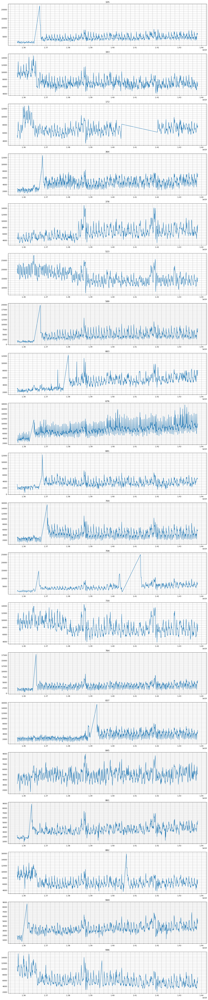

In [110]:
list_stores_to_check = [105,163,172,364,378,523,589,663,676,681,700,708,730,764,837,845,861,882,969,986]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

#только значения когда магазин открыт

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

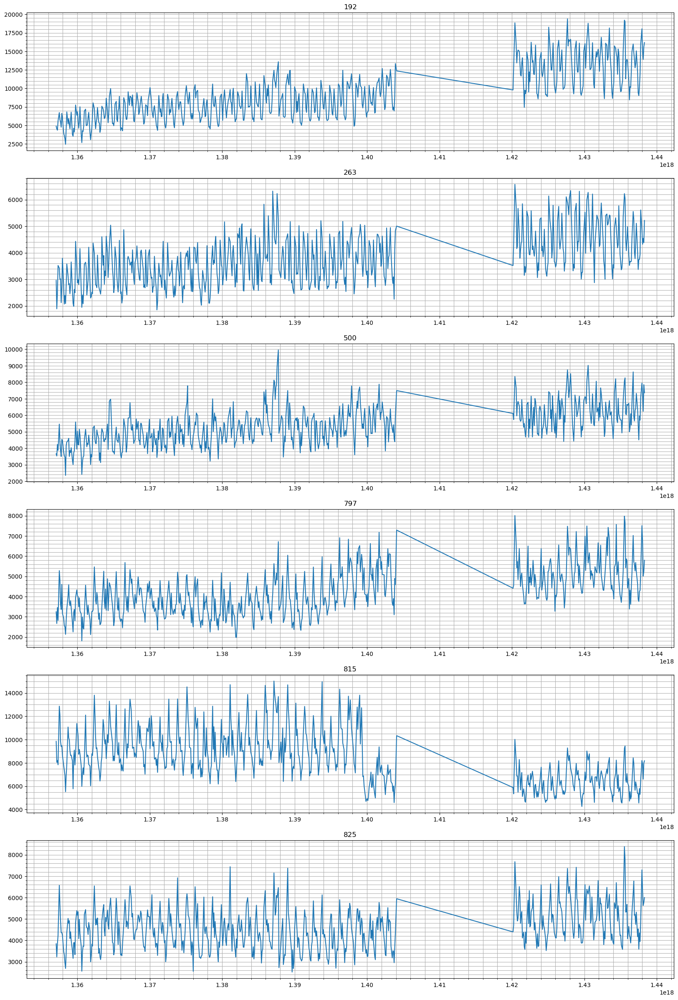

In [111]:
list_stores_to_check = [192,263,500,797,815,825]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

#только значения когда магазин открыт

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

## Еще несколько рядов но в виде точек (все дни включая когда магазин не работал)

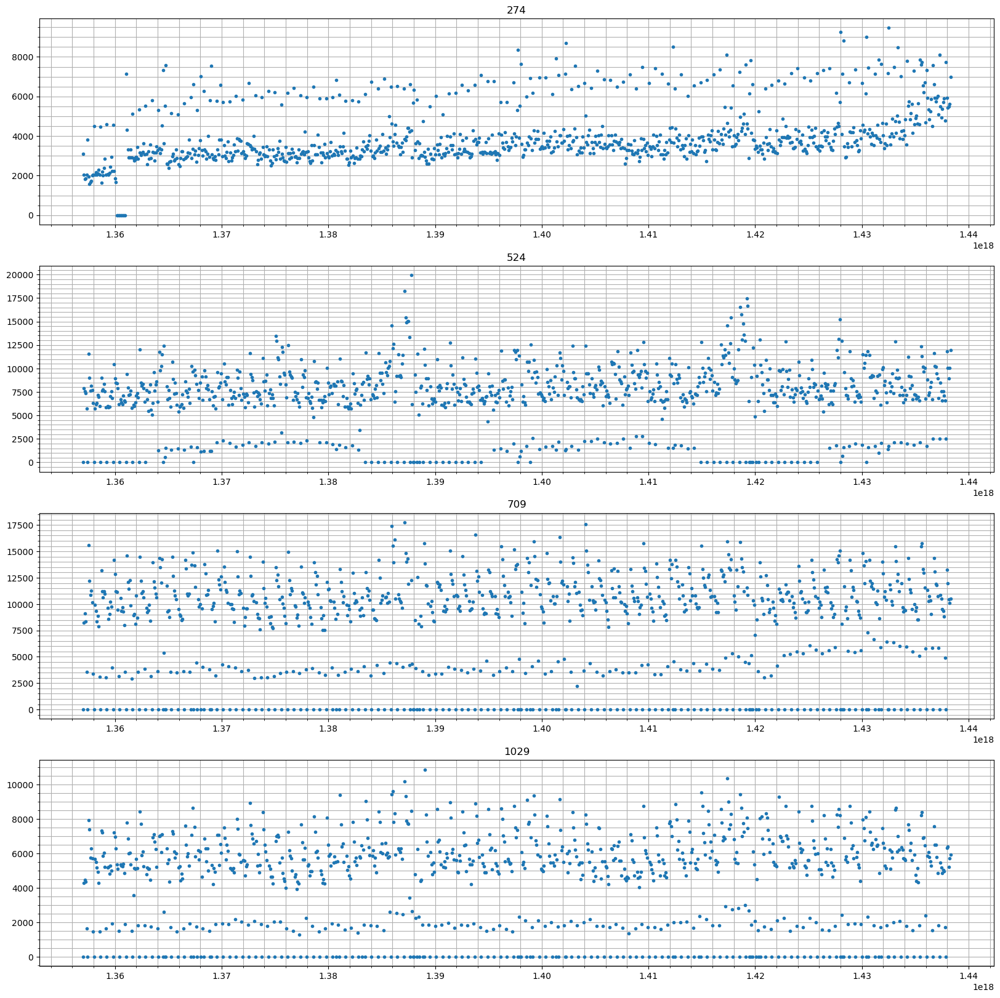

In [112]:
list_stores_to_check = [274,524,709,1029]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, '.')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

## Эти же ряды но непрерывно (только когда магазин работал)

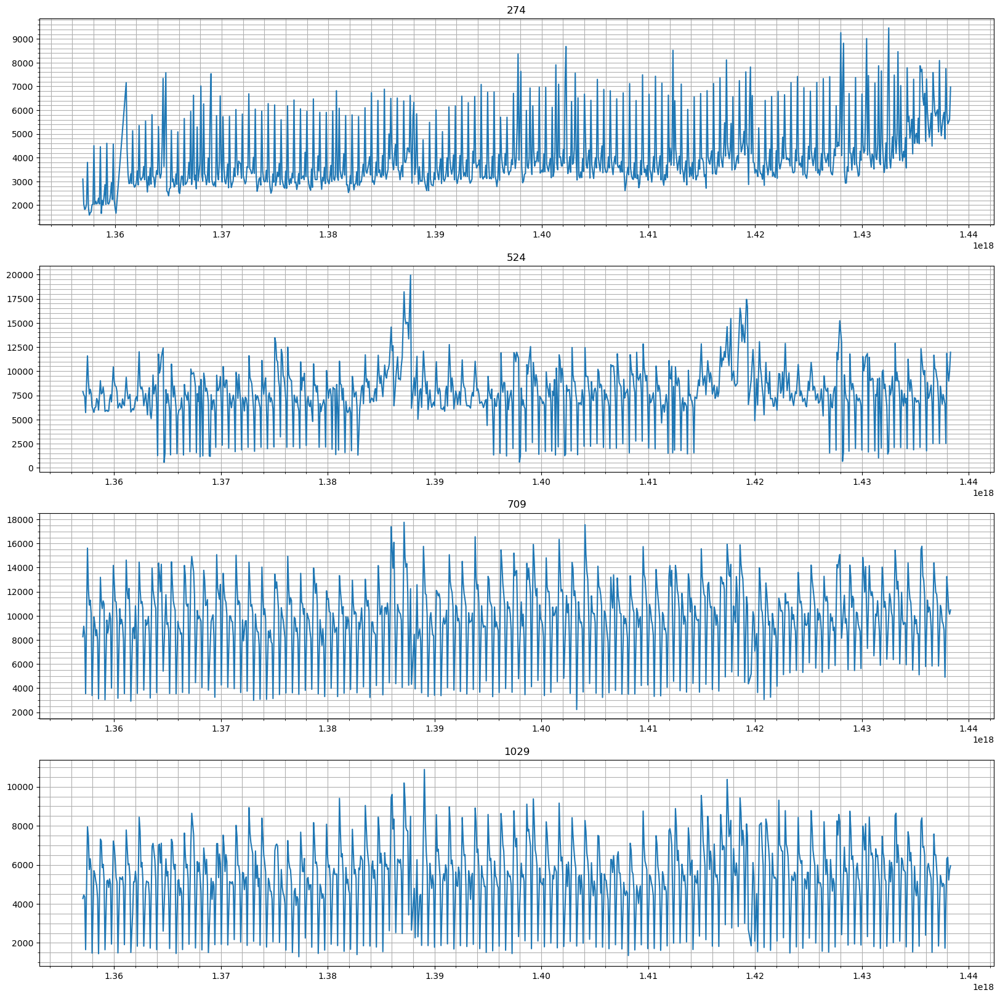

In [113]:
list_stores_to_check = [274,524,709,1029]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

## Еще несколько рядов (только когда магазин работал)

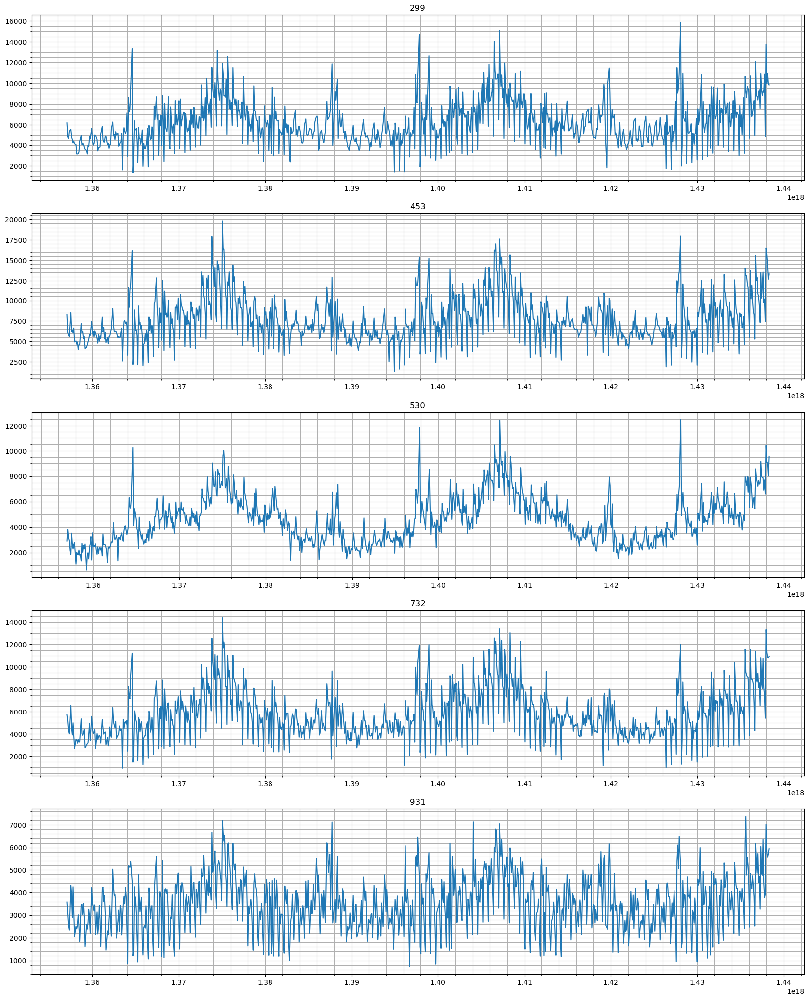

In [116]:
list_stores_to_check = [299,453,530,732,931]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

In [27]:
#моменты времени для указанных рядов до которых элементы рассматривать не будем

store_dates_to_remove = {   105:1.368e18, 163:1.368e18,
                            172:1.366e18, 364:1.37e18,
                            378:1.39e18, 523:1.39e18,
                            589:1.37e18, 663:1.39e18,
                            676:1.366e18, 681:1.37e18,
                            700:1.373e18, 708:1.368e18,
                            709:1.423e18, 730:1.39e18,
                            764:1.368e18, 837:1.396e18,
                            845:1.368e18, 861:1.368e18,
                            882:1.368e18, 969:1.366e18,
                            986:1.368e18, 192:1.421e18,
                            263:1.421e18, 500:1.421e18,
                            797:1.421e18, 815:1.421e18,
                            825:1.421e18}

# создадим столбец Delete с пометкой на удаление значений ряда с датой меньшей указанной

for key, value in store_dates_to_remove.items():
    df.loc[(df['Store'] == key) & (df['DateInt'] < value), 'Delete'] = True

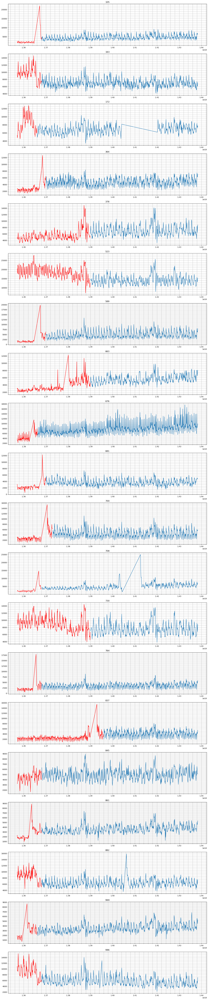

In [123]:
#посмотрим на указанные ряды, удаленную часть выделим красным

list_stores_to_check = [105,163,172,364,378,523,589,663,676,681,700,708,730,764,837,845,861,882,969,986]

plt.rcParams["figure.figsize"] = [20,len(list_stores_to_check)*5]

j = 1
for i in list_stores_to_check:
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Delete'] == True)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Delete'] == True)]['Sales']
    
    X2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Delete'] != True)]
    y2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Delete'] != True)]['Sales']
    
    plt.subplot(len(list_stores_to_check),1,j)
    plt.plot(X1['DateInt'], y1, 'r-')
    plt.plot(X2['DateInt'], y2, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(i)
    j += 1

In [28]:
### удалим аномальные данные

df = df.loc[df['Delete'] != True]

## Удалим выбросы с отклонением >= 3

In [29]:
#метод считает для каждой точки модифицированный z-score и возвращает true если элемент - выброс

def mad_based_outlier(points, thresh=3.5):
    if len(points.shape) == 1:
        points = points[:,None]
    
    median = np.median(points, axis=0)
    
    med_abs_deviation = np.median(np.absolute(points - median))

    modified_z_score = 0.6745 * (points - median) / med_abs_deviation

    return modified_z_score > thresh

In [30]:
#для каждого ряда пометим наблюдения выбросы

for i in df['Store'].unique():
    df.loc[(df['Set'] == 1) & (df['Store'] == i) & (df['Open'] == 1), 'Outlier'] = \
        mad_based_outlier(df.loc[(df['Set'] == 1) & (df['Store'] == i) & (df['Open'] == 1)]['Sales'], 3)

C:\Users\cassi\AppData\Local\Temp\ipykernel_18468\2863808409.py:5: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  points = points[:,None]
C:\Users\cassi\AppData\Local\Temp\ipykernel_18468\2863808409.py:5: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  points = points[:,None]


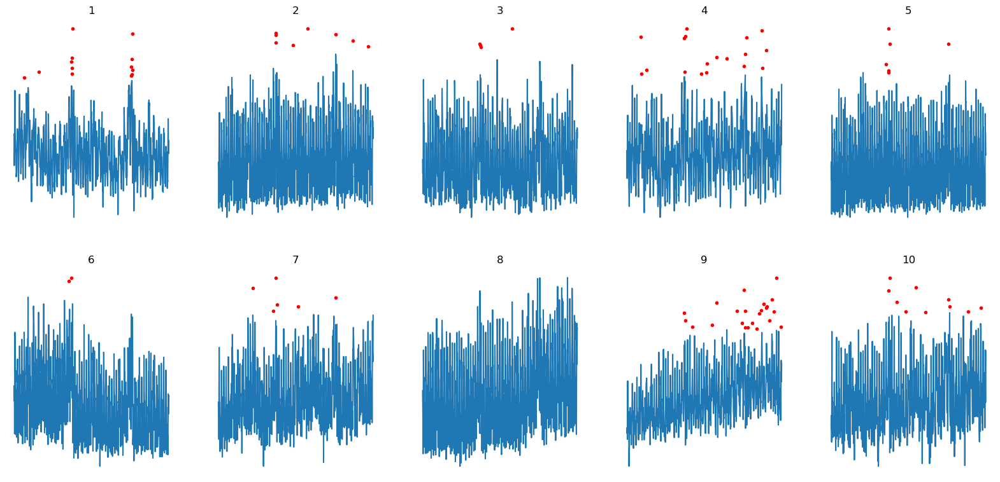

In [129]:
#посмотрим на выбросы первых 10 рядов (магазинов)

no_stores_to_check = 10

plt.rcParams["figure.figsize"] = [20,no_stores_to_check*5]

for i in range(1, no_stores_to_check+1):
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == False)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == False)]['Sales']

    # Outliers
    X2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == True)]
    y2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == True)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(10,5,i)
    plt.plot(X1['Date'], y1, '-')
    plt.plot(X2['Date'], y2, 'r.')
    plt.title(i)
    plt.axis('off')


## Разделим данные в обучении и тест для заполнения выбросов

In [31]:
#поделим данные без выбросов на обучение и тест 

X_train, X_test, y_train, y_test = train_test_split(df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (df['Outlier'] == False)][features_x],
                                                    df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (df['Outlier'] == False)][features_y],
                                                    test_size=0.1, random_state=seed)

In [32]:
#Есть разные api для обучения xgboost, будем использовать тот, где обучающие данные нужно обернуть в DMatrix

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

In [33]:
num_round = 4000
evallist = [(dtrain, 'train'), (dtest, 'test')]

In [34]:
param = {'bst:max_depth':12,
         'bst:eta':0.01,
         'subsample':0.8,
         'colsample_bytree':0.7,
         'silent':1,
         'objective':'reg:linear',
         'nthread':6,
         'seed':seed}

# параметры:
# subsample – доля обучающей подвыборки дерева
# colsample_bytree – доля подмножества колонок для обучения дерева
# silent - нужно ли печатать диагностику
# objective - тип задачи и тип модели (reg - задача регрессии, linear - линейная регрессия)
# nthread - количество потоков

# обучим модель
# feval - метрика
# verbose_eval - количество шагов бустинга для которых будет выводиться метрика
# early_stopping_rounds - количество шагов бустинга в течении которых если не было ни одного улучшения
#    метрики, то обучение заканчивается
# 2 аргумент - тренировочный набор
# 3 аргумент - количество итераций бустинга
# 4 аргумент - тестовый набор


bst = xgb.train(param, dtrain, num_round, evallist, feval=rmspe_xg, verbose_eval=250, early_stopping_rounds=250)

C:\Users\cassi\anaconda3\lib\site-packages\xgboost\core.py:617: FutureWarning: Pass `evals` as keyword args.
  warnings.warn(msg, FutureWarning)
C:\Users\cassi\anaconda3\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


[15:40:32] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:32] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "bst:eta", "bst:max_depth", "silent" } are not used.

[0]	train-rmse:5.78742	train-rmspe:0.99682	test-rmse:5.78692	test-rmspe:0.99682
[250]	train-rmse:0.11973	train-rmspe:0.18864	test-rmse:0.12136	test-rmspe:0.13391
[500]	train-rmse:0.10175	train-rmspe:0.16792	test-rmse:0.10476	test-rmspe:0.11611
[750]	train-rmse:0.09386	train-rmspe:0.13338	test-rmse:0.09818	test-rmspe:0.10919
[1000]	train-rmse:0.08952	train-rmspe:0.11393	test-rmse:0.09498	test-rmspe:0.10588
[1250]	train-rmse:0.08638	train-rmspe:0.10780	test-rmse:0.09298	test-rmspe:0.10382
[1500]	train-rmse:0.08397	train-rmspe:0.09564	test-rm

In [35]:
# выбросы

dpred = xgb.DMatrix(df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (df['Outlier'] == True)][features_x])

In [36]:
#сделаем предсказания на выбросах

ypred_bst = bst.predict(dpred)

In [37]:
#добавим предсказания на выбросах в данные

df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (df['Outlier'] == True), 'SalesLog'] = ypred_bst
df.loc[(df['Set'] == 1) & (df['Open'] == 1) & (df['Outlier'] == True), 'Sales'] = np.exp(ypred_bst) - 1

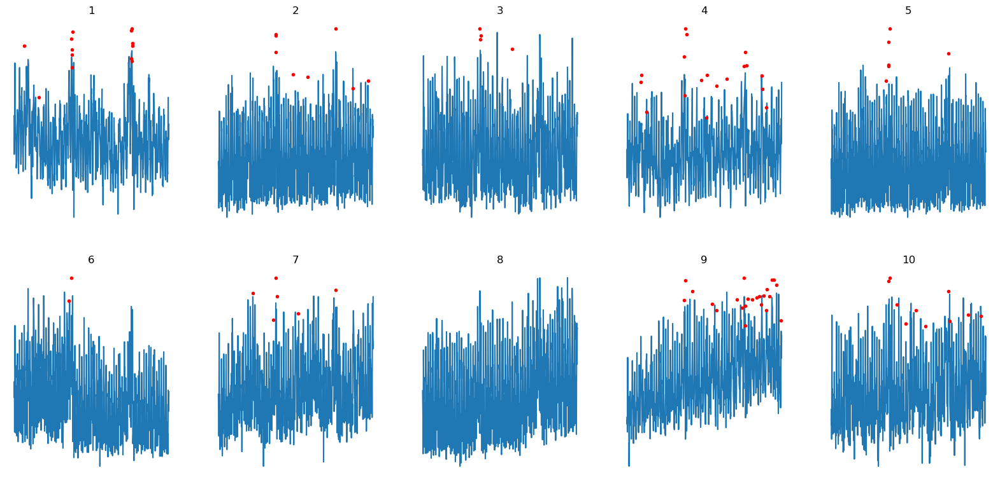

In [137]:
### посмотрим на то какими стали выбросы первых 10 рядов (магазинов)
### видно что точки стали ниже чем раньше

no_stores_to_check = 10

plt.rcParams["figure.figsize"] = [20,no_stores_to_check*5]

for i in range(1,no_stores_to_check+1):
    stor = i

    # Normal sales
    X1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == False)]
    y1 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == False)]['Sales']

    # Outliers
    X2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == True)]
    y2 = df.loc[(df['Set'] == 1) & (df['Store'] == stor) & (df['Open'] == 1) & (df['Outlier'] == True)]['Sales']

    Xt = df.loc[(df['Store'] == stor)]
    
    plt.subplot(10,5,i)
    plt.plot(X1['Date'], y1, '-')
    plt.plot(X2['Date'], y2, 'r.')
    plt.title(i)
    plt.axis('off')

## Генерация некоторых дополнительных данных о магазинах из продаж

In [138]:
df

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Set,Id,SalesLog,DateDay,DateWeek,DateMonth,DateYear,DateDayOfYear,DateInt,StoreType,Assortment,CompetitionDistance,CompetitionOpenInt,PromoInterval0,Delete,Outlier
0,1,5,2015-07-31,5263.0,555.0,1.0,1,1,1,1,NaN,8.568646,31,31,7,2015,212,1438300800000000000,2,0,1270.0,1220227200000000000,NaN,NaN,False
1,2,5,2015-07-31,6064.0,625.0,1.0,1,1,1,1,NaN,8.710290,31,31,7,2015,212,1438300800000000000,0,0,570.0,1193875200000000000,1.0,NaN,False
2,3,5,2015-07-31,8314.0,821.0,1.0,1,1,1,1,NaN,9.025816,31,31,7,2015,212,1438300800000000000,0,0,14130.0,1164931200000000000,1.0,NaN,False
3,4,5,2015-07-31,13995.0,1498.0,1.0,1,1,1,1,NaN,9.546527,31,31,7,2015,212,1438300800000000000,2,2,620.0,1251763200000000000,NaN,NaN,False
4,5,5,2015-07-31,4822.0,559.0,1.0,1,1,1,1,NaN,8.481151,31,31,7,2015,212,1438300800000000000,0,0,29910.0,1427846400000000000,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1058238,1111,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,41084.0,NaN,1,31,8,2015,213,1438387200000000000,0,0,1900.0,1401580800000000000,1.0,NaN,NaN
1058239,1112,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,41085.0,NaN,1,31,8,2015,213,1438387200000000000,2,2,1880.0,1143849600000000000,NaN,NaN,NaN
1058240,1113,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,41086.0,NaN,1,31,8,2015,213,1438387200000000000,0,2,9260.0,-9223372036854775808,NaN,NaN,NaN
1058241,1114,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,41087.0,NaN,1,31,8,2015,213,1438387200000000000,0,2,870.0,-9223372036854775808,NaN,NaN,NaN


In [38]:
df3 = df.copy().sort_values(by = ['Date']).set_index('Date')

df3.index = df3.index.to_period('D')

df3 = df3.set_index('Store', append=True).sort_index(level = 1).swaplevel()

In [171]:
df3

DayOfWeek   Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  Set      Id  SalesLog  DateDay  DateWeek  DateMonth  DateYear  DateDayOfYear              DateInt  StoreType  Assortment  CompetitionDistance   CompetitionOpenInt  PromoInterval0 Delete Outlier
Store Date                                                                                                                                                                                                                                                                                 
1     2013-01-01          2     0.0        0.0   0.0      0             2              1    1     NaN  0.000000        1         1          1      2013              1  1356998400000000000          2           0               1270.0  1220227200000000000            -1.0    NaN     NaN
      2013-01-02          3  5530.0      668.0   1.0      0             1              1    1     NaN  8.618124        2         1          1      2013              2  1357084800000000000          2           0               1270.0  1220227200000000000            -1.0    NaN   False
      2013-01-03          4  4327.0      578.0   1.0      0             1              1    1     NaN  8.372861        3         1          1      2013              3  1357171200000000000          2           0               1270.0  1220227200000000000            -1.0    NaN   False
      2013-01-04          5  4486.0      619.0   1.0      0             1              1    1     NaN  8.408940        4         1          1      2013              4  1357257600000000000          2           0               1270.0  1220227200000000000            -1.0    NaN   False
      2013-01-05          6  4997.0      635.0   1.0      0             1              1    1     NaN  8.516793        5         1          1      2013              5  1357344000000000000          2           0               1270.0  1220227200000000000            -1.0    NaN   False
...                     ...     ...        ...   ...    ...           ...            ...  ...     ...       ...      ...       ...        ...       ...            ...                  ...        ...         ...                  ...                  ...             ...    ...     ...
1115  2015-09-13          7     NaN        NaN   0.0      0             1              0    0  4280.0       NaN       13        37          9      2015            256  1442102400000000000          3           2               5350.0 -9223372036854775808             3.0    NaN     NaN
      2015-09-14          1     NaN        NaN   1.0      1             1              0    0  3424.0       NaN       14        38          9      2015            257  1442188800000000000          3           2               5350.0 -9223372036854775808             3.0    NaN     NaN
      2015-09-15          2     NaN        NaN   1.0      1             1              0    0  2568.0       NaN       15        38          9      2015            258  1442275200000000000          3           2               5350.0 -9223372036854775808             3.0    NaN     NaN
      2015-09-16          3     NaN        NaN   1.0      1             1              0    0  1712.0       NaN       16        38          9      2015            259  1442361600000000000          3           2               5350.0 -9223372036854775808             3.0    NaN     NaN
      2015-09-17          4     NaN        NaN   1.0      1             1              0    0   856.0       NaN       17        38          9      2015            260  1442448000000000000          3           2               5350.0 -9223372036854775808             3.0    NaN     NaN

[1058243 rows x 23 columns]

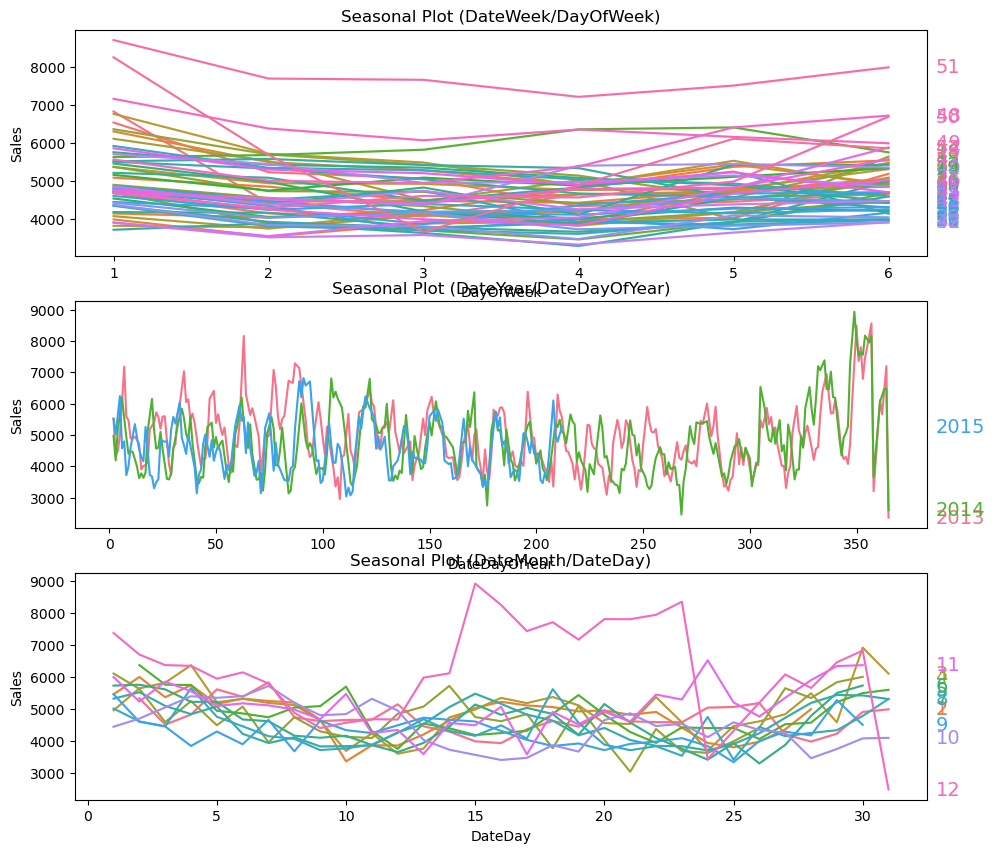

In [173]:
#сезонные графики

df3_store1 = df3[(df3['Set'] == 1) & (df3['Open'] == 1)].loc[(1,)]

fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(11, 10))
seasonal_plot(df3_store1, y="Sales", period="DateWeek", freq="DayOfWeek", ax=ax0)
seasonal_plot(df3_store1, y="Sales", period="DateYear", freq="DateDayOfYear", ax=ax1);
seasonal_plot(df3_store1, y="Sales", period="DateMonth", freq="DateDay", ax=ax2);

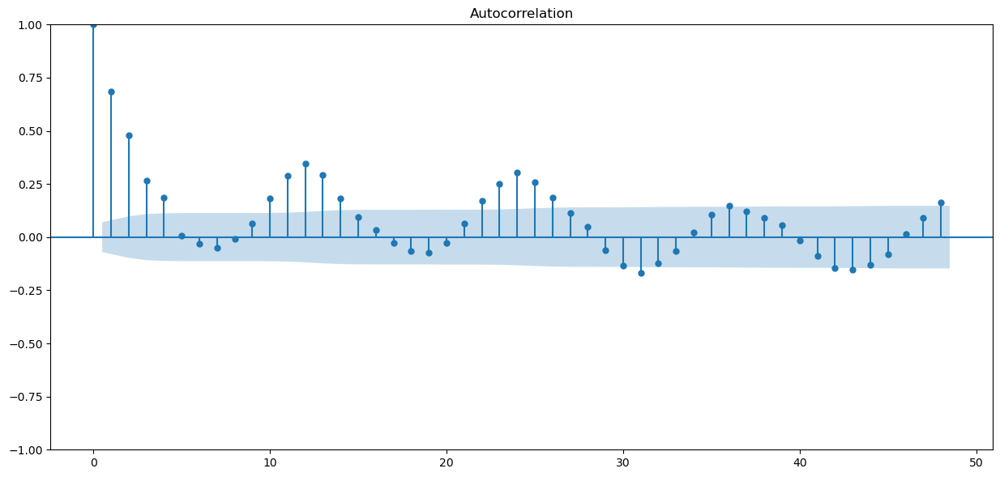

C:\Users\cassi\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


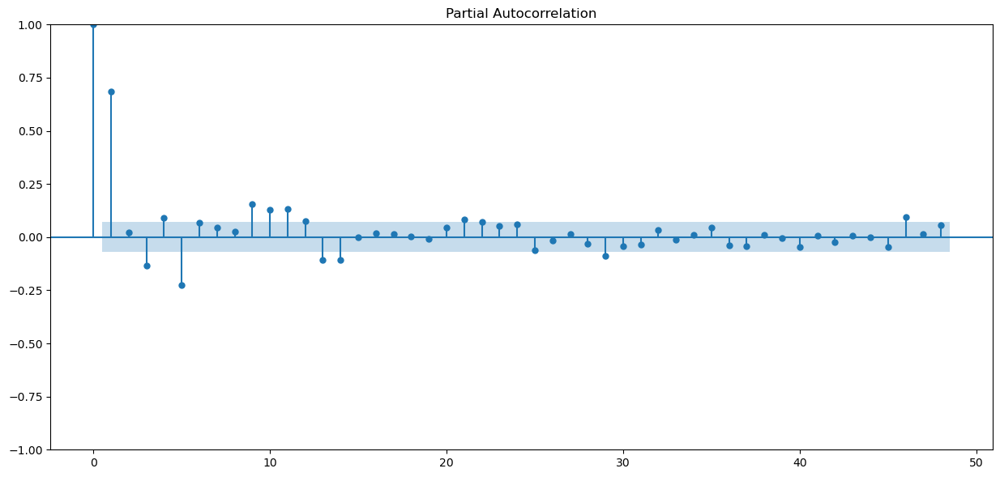

In [174]:
plt.figure(figsize(15,15))

ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(df3_store1['Sales'].dropna(), lags=48, ax=ax)
pylab.show()

ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(df3_store1['Sales'].dropna(), lags=48, ax=ax)
pylab.show()

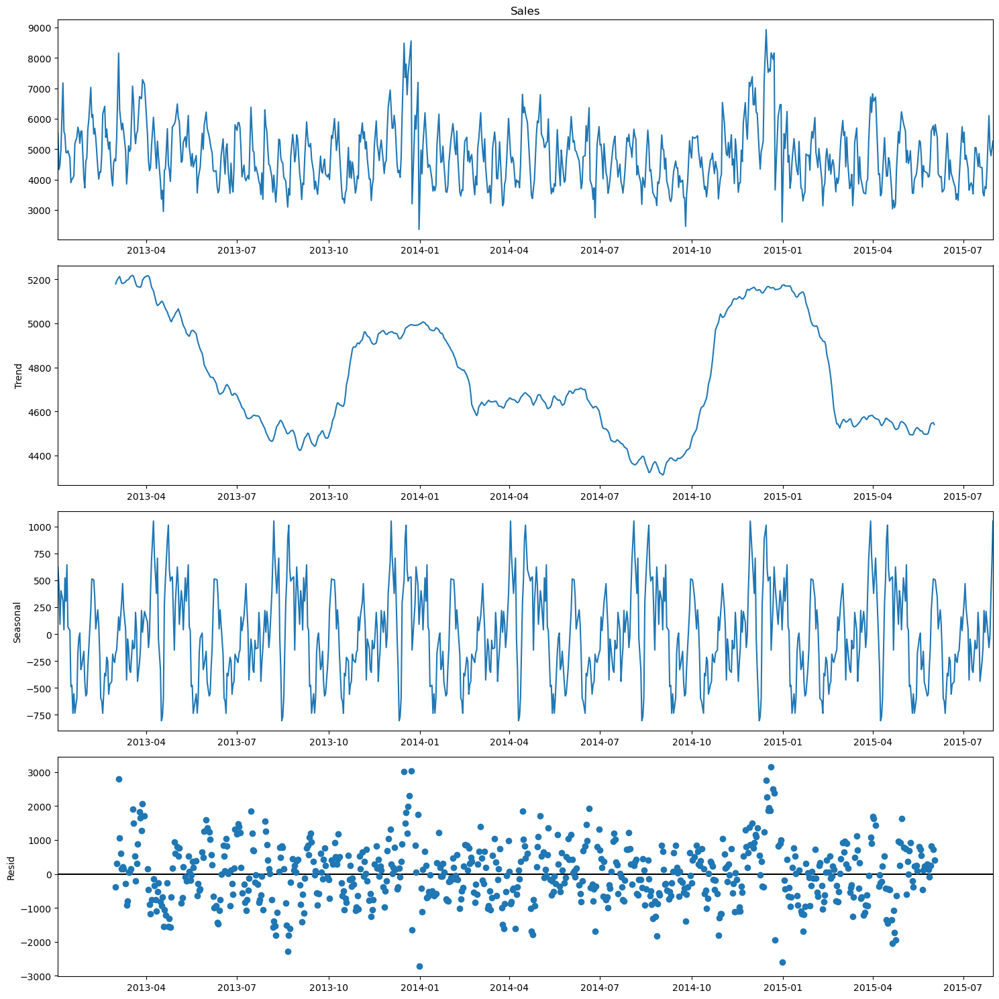

<Figure size 1500x1500 with 0 Axes>

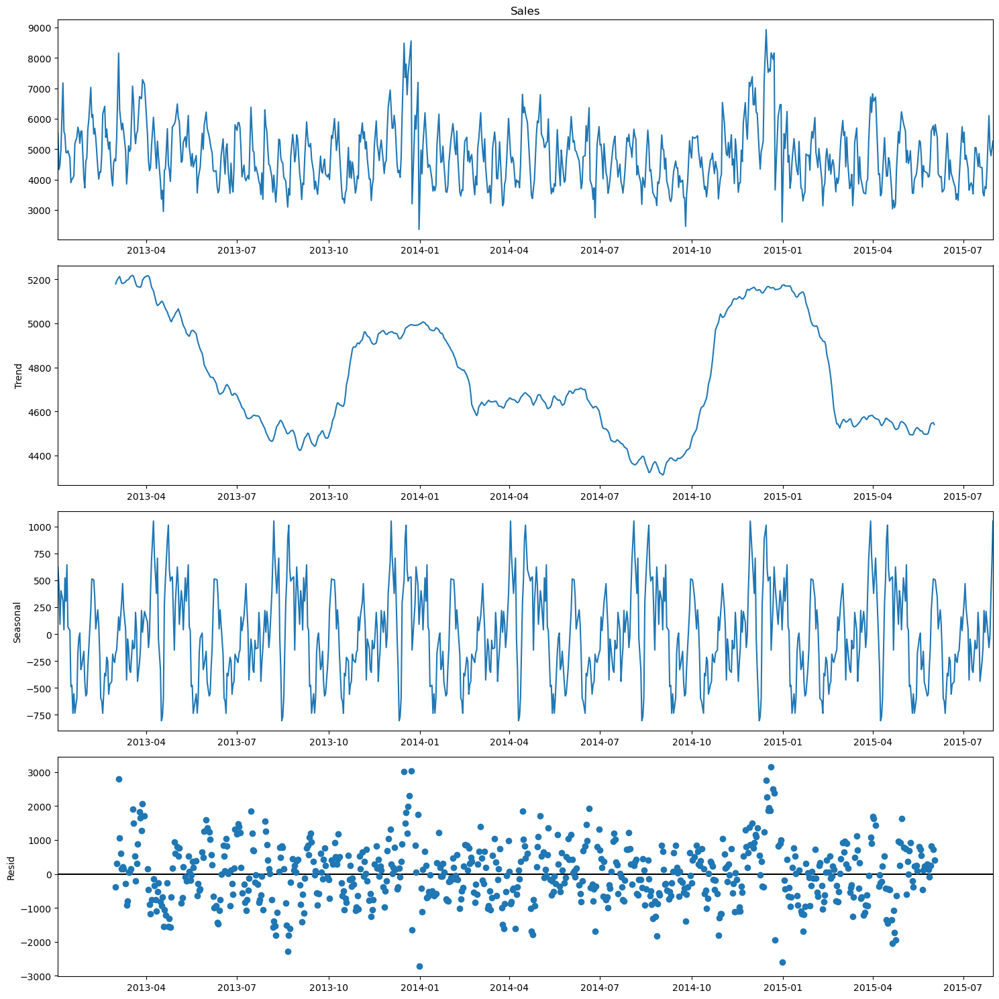

In [175]:
plt.figure(figsize(15,15))
df3_store1_decompose = df3_store1.copy()
df3_store1_decompose.index = df3_store1_decompose.index.to_timestamp()
df3_store1_decompose = df3_store1_decompose.asfreq('D')

sm.tsa.seasonal_decompose(df3_store1_decompose['Sales'].dropna(), period=100).plot()

C:\Users\cassi\AppData\Local\Temp\ipykernel_13848\1742349646.py:3: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version.
  fs = pd.Timedelta("1Y") / pd.Timedelta("1D")


<AxesSubplot:title={'center':'Periodogram'}, ylabel='Variance'>

<Figure size 1500x500 with 0 Axes>

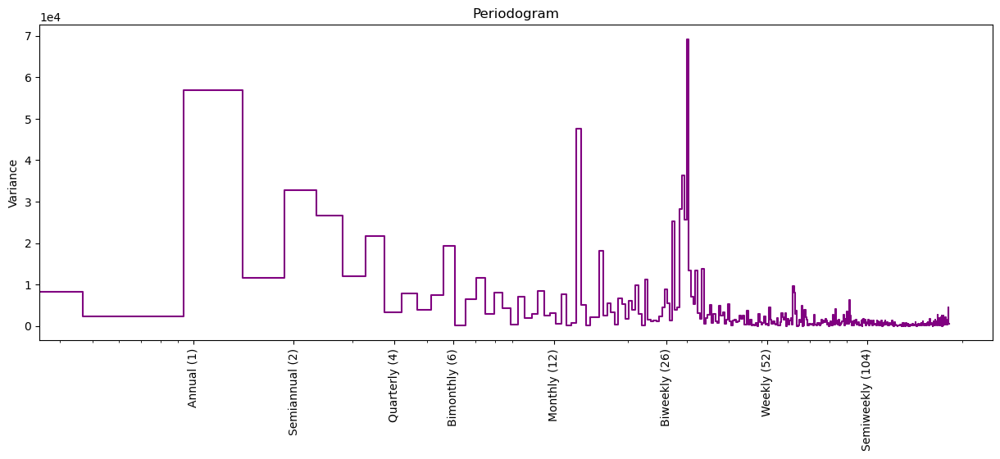

In [207]:
# частоты смещены относительно меток, поскольку в ряду не все дни подряд, нерабочие удалены, 
# в методе periodogram все значения должны соответствовать одинаковому периоду

plt.figure(figsize(15,5))

plot_periodogram(df3_store1['Sales'].dropna())

C:\Users\cassi\AppData\Local\Temp\ipykernel_13848\1742349646.py:3: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version.
  fs = pd.Timedelta("1Y") / pd.Timedelta("1D")


<AxesSubplot:title={'center':'Periodogram'}, ylabel='Variance'>

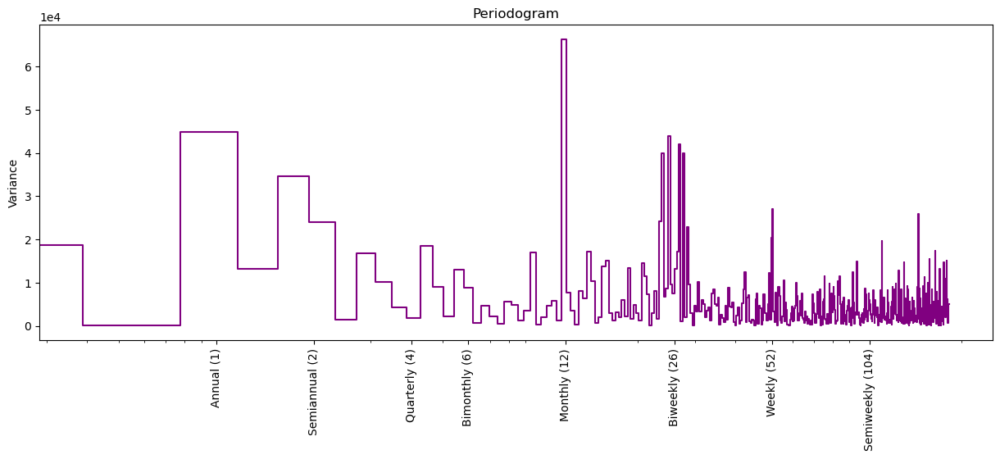

In [206]:
#заполним нерабочие дни шумовым значением чтобы были все дни в данных дял периодограммы и метки не были смещены
#запускать несколько раз, так как могут появляться незначимые частоты

# видно, что наибольшая мощность у сезонов соттветствующим году, двум неделям, месяцу

plot_periodogram(df3[(df3['Set'] == 1)].loc[(1,)]['Sales'].apply(lambda s : s if s != 0 else np.random.rand(1)[0] * 10000))

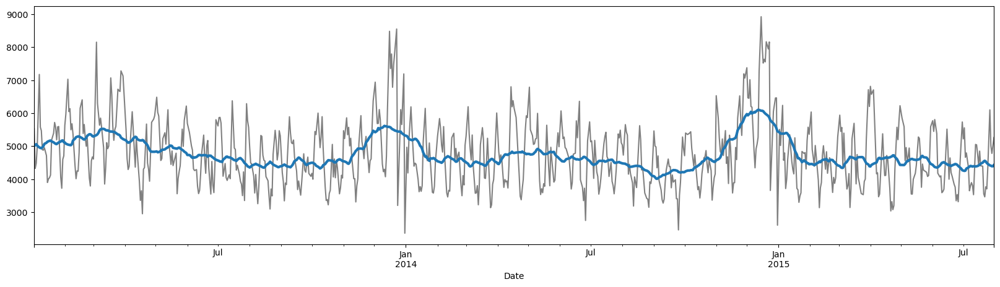

In [208]:
#удалим скользящее среднее с окном большим чем месяц и 2 недели

df3_store1_moving_average = df3_store1['Sales'].dropna().rolling(
    window=40,       
    center=True,     
    min_periods=20,  
).mean()             


plt.figure(figsize(20,5))

ax = df3_store1['Sales'].dropna().plot(style="-", color="0.5")

df3_store1_moving_average.plot(
    ax=ax, linewidth=3, legend=False,
);

C:\Users\cassi\AppData\Local\Temp\ipykernel_13848\1742349646.py:3: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version.
  fs = pd.Timedelta("1Y") / pd.Timedelta("1D")


<AxesSubplot:title={'center':'Periodogram'}, ylabel='Variance'>

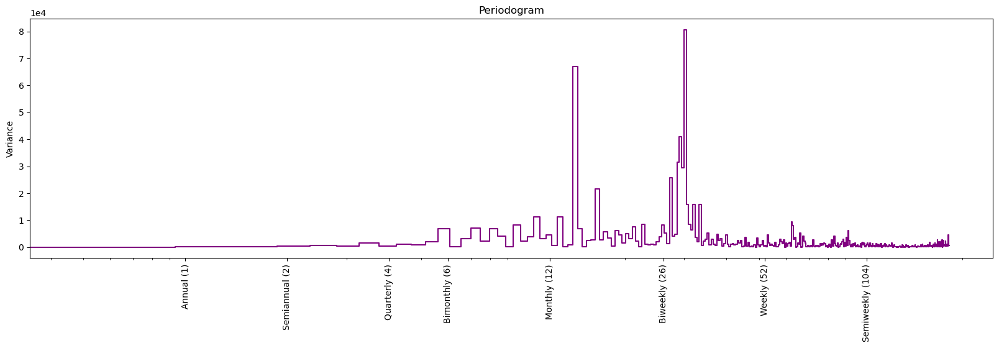

In [209]:
plot_periodogram(df3_store1['Sales'].dropna() - df3_store1_moving_average)

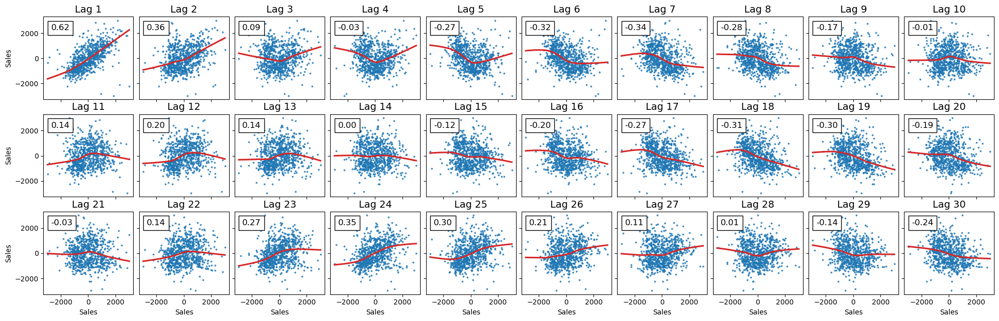

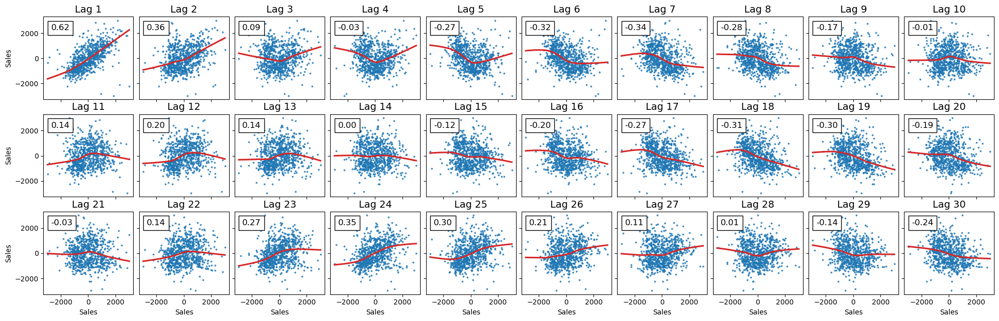

In [58]:
plot_lags(df3_store1['Sales'].dropna() - df3_store1_moving_average, lags=30, nrows=3)

<AxesSubplot:xlabel='Date'>

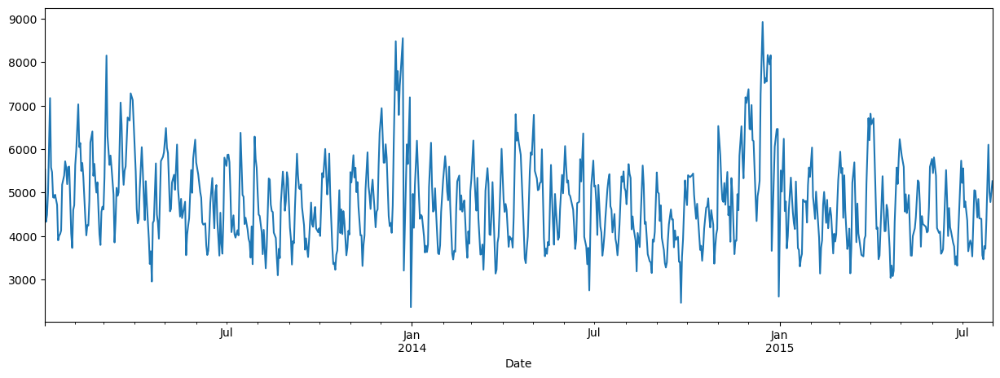

In [210]:
plt.figure(figsize(15,5))
df3[(df3['Set'] == 1) & (df3['Open'] == 1)].loc[(1, )]['Sales'].plot()

In [39]:
# заполним значения когда магазин закрыт медианой соседних значений, чтобы не выбрасывать такие моменты времени
#upd: так как результат ухудшился, то обучал только там нде магазин открыт
#upd2: прогнозы улучшились после того как создали признаки на все моменты а обучили на тех моментах
#когда магазин открыт из-за того что признаки стали соответствовать своим меткам

stores_N = list({store for (store, date) in df3.index})

df4 = df3.copy()

for store_i in stores_N:
    
    df3_filled_open0 = df3[(df3.index.get_level_values(0) == store_i) & (df3['Set'] == 1)]
    
    df3_filled_open0_moving_average = df3_filled_open0['Sales'].rolling(
        window=7,       
        center=True,      
        min_periods=3,  
    ).median()   

    df3_temp_store_i = df3_filled_open0.copy()
    
    df3_temp_store_i.loc[(df3_filled_open0['Open'] == 0), 'Sales'] = \
            df3_filled_open0_moving_average[df3_filled_open0['Open'] == 0]
    
    
    df4.loc[(df4.index.get_level_values(0) == store_i) & (df4['Set'] == 1), 'Sales'] = df3_temp_store_i['Sales']
    
    #display(df3_temp_store_i['Sales'])
    

<AxesSubplot:xlabel='Date'>

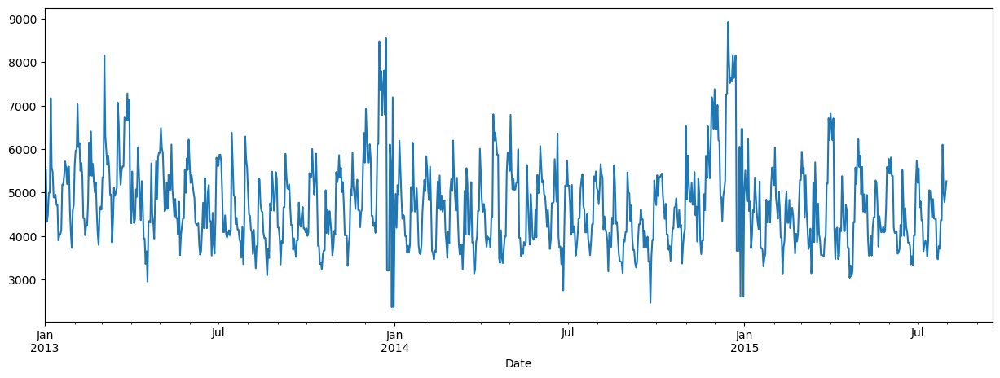

In [212]:
plt.figure(figsize(15,5))
df4.loc[(1,)]['Sales'].plot()

In [40]:

stores_N = list({store for (store, date) in df4.index})           #можно через get_level_values
stores_N_set0 = list({store for (store, date) in df4[(df4['Set'] == 0)].index})      #нужно так как не для всех магаизнов нужно делать предсказания

df4_with_predicts = df4.copy()
df4_with_predicts['Sales_LR_Predict'] = np.nan


In [41]:
df4_with_predicts['lag_28'] = np.nan
df4_with_predicts['lag_14'] = np.nan
df4_with_predicts['lag_7'] = np.nan
#df4_with_predicts['lag_6'] = np.nan
#df4_with_predicts['lag_5'] = np.nan
#df4_with_predicts['lag_4'] = np.nan
#df4_with_predicts['lag_3'] = np.nan
df4_with_predicts['lag_2'] = np.nan
df4_with_predicts['lag_1'] = np.nan

#df4_with_predicts['lag_21'] = np.nan
#df4_with_predicts['lag_42'] = np.nan
#df4_with_predicts['lag_365'] = np.nan



In [42]:
features_x_lr = ['Promo']

In [43]:
#todo попробовать обучить на SalesLog
import warnings
warnings.filterwarnings('ignore')

for store_i in stores_N:
    
    #print(store_i)
    
    if (store_i not in [192, 263, 500, 797, 815, 825]):

            fourier = CalendarFourier(freq='A', order=6)  

            #fourierM = CalendarFourier(freq='M', order=1)

            df4_store = df4.copy()[(df4['Set'] == 1)].loc[(store_i, )]
            lr_y = df4_store['Sales']   #todo попробовать обучить на SalesLog

            dp = DeterministicProcess(
                    index=df4_store['Sales'].dropna().index,  # dates from the training data
                    constant=True,                             # the intercept
                    order=2,                                   # quadratic trend  todo поменьше
                    additional_terms = [fourier],
                    drop=True,                                 # drop terms to avoid collinearity
            )

            #dp2 = DeterministicProcess(
            #        index=df4_store['Sales'].dropna().index,
            #        additional_terms = [fourierM]
            #)
            

            dp_X = pd.concat([dp.in_sample(), 
                   #           dp2.in_sample(),
                              pd.get_dummies(df4_store['DayOfWeek'], prefix='DayOfWeek'),
                              pd.get_dummies(df4_store['DateDay'], prefix='DateDay'),
                              df4_store[features_x_lr]], 
                              axis=1)
            

            dp_X['predNG'] = ((dp_X.index.day == 31) & (dp_X.index.month == 12))
            dp_X['22or23dec'] = ((dp_X.index.day.isin([22, 23])) & (dp_X.index.month == 12))
            dp_X['lag_28'] = df4_store['Sales'].shift(28).fillna(0.0)
            dp_X['lag_14'] = df4_store['Sales'].shift(14).fillna(0.0)
            dp_X['lag_7'] = df4_store['Sales'].shift(7).fillna(0.0)
            dp_X['lag_1'] = df4_store['Sales'].shift(1).fillna(0.0)
            dp_X['lag_2'] = df4_store['Sales'].shift(2).fillna(0.0)
            dp_X['lag_42'] = df4_store['Sales'].shift(42).fillna(0.0)
            dp_X['moving_median'] = df4_store['Sales'].shift(1).rolling(window=28, min_periods=1).median().fillna(0)
            dp_X['moving_mean'] = df4_store['Sales'].shift(1).rolling(window=28, min_periods=1).mean().fillna(0)
            dp_X['moving_std'] = df4_store['Sales'].shift(1).rolling(window=14, min_periods=1).std().fillna(0)
            dp_X['moving_sum'] = df4_store['Sales'].shift(1).rolling(window=28, min_periods=1).sum().fillna(0)
            


            dp_X = dp_X[df4_store['Open'] == 1]
            lr_y = lr_y[df4_store['Open'] == 1]


            lr = LinearRegression().fit(dp_X, lr_y)

            df4_with_predicts.loc[(df4_with_predicts.index.get_level_values(0) == store_i) 
                              & (df4_with_predicts['Set'] == 1) 
                              & (df4_with_predicts['Open'] == 1), 'Sales_LR_Predict'] = lr.predict(dp_X)


            #предсказания на прогнозах

            if (store_i not in stores_N_set0): continue    #пропускаем магаизы для которых не нужно делать предсказания


            df4_store_set0 = df4.copy()[(df4['Set'] == 0)].loc[(store_i, )]


            dp_X_set0 = pd.concat([dp.out_of_sample(steps = 48), 
                         #           dp2.out_of_sample(steps = 48),
                                    pd.get_dummies(df4_store_set0['DayOfWeek'], prefix='DayOfWeek'),
                                    pd.get_dummies(df4_store_set0['DateDay'], prefix='DateDay'), 
                                    df4_store_set0[features_x_lr]], 
                                    axis=1)

            dp_X_set0['predNG'] = ((dp_X_set0.index.day == 31) & (dp_X_set0.index.month == 12))
            dp_X_set0['22or23dec'] = ((dp_X_set0.index.day.isin([22, 23])) & (dp_X_set0.index.month == 12))



            sales = df4.copy().loc[(store_i, )]['Sales'].to_numpy()
            predicts = []

            for (i, (index, row_X)) in enumerate(dp_X_set0.iterrows()):

                lag_1 = sales[i - 48 - 1:][0]
                lag_2 = sales[i - 48 - 2:][0]
                lag_7 = sales[i - 48 - 7:][0]
                lag_14 = sales[i - 48 - 14:][0]
                lag_28 = sales[i - 48 - 28:][0]
                lag_42 = sales[i - 48 - 42:][0]
                moving_median = np.median(sales[i - 48 - 28 : i - 48])
                moving_mean = sales[i - 48 - 28 : i - 48].mean()
                moving_std = sales[i - 48 - 14 : i - 48].std()
                moving_sum = sales[i - 48 - 28 : i - 48].sum()

                #print(lag_1, lag_7, lag_14, lag_28)

                X = row_X.copy().to_numpy()
                X = np.append(X, [lag_28, lag_14, lag_7, lag_1, lag_2, lag_42, moving_median, moving_mean, 
                                                                               moving_std, moving_sum])

                y = lr.predict(X.reshape(1, X.shape[0]))
                predicts.append(y)

                sales[i - 48] = y


            df4_with_predicts.loc[(df4_with_predicts.index.get_level_values(0) == store_i) 
                              & (df4_with_predicts['Set'] == 0), 'Sales_LR_Predict'] = predicts.copy()
            
        
    else:

        df4_store = df4.copy()[(df4['Set'] == 1)].loc[(store_i, )]
        lr_y = df4_store['Sales'].copy()   #todo попробовать обучить на SalesLog

        dp = DeterministicProcess(
                index=df4_store['Sales'].dropna().index,  # dates from the training data
                constant=True,                             # the intercept
                drop=True,                                 # drop terms to avoid collinearity
        )


        dp_X = pd.concat([dp.in_sample(), 
                          pd.get_dummies(df4_store['DayOfWeek'], prefix='DayOfWeek'),
                          pd.get_dummies(df4_store['DateDay'], prefix='DateDay'),
                          df4_store[features_x_lr]], axis=1)


        dp_X['predNG'] = ((dp_X.index.day == 31) & (dp_X.index.month == 12))
        dp_X['22or23dec'] = ((dp_X.index.day.isin([22, 23])) & (dp_X.index.month == 12))
    

        dp_X = dp_X[df4_store['Open'] == 1]
        lr_y = lr_y[df4_store['Open'] == 1]

        
        lr = LinearRegression().fit(dp_X, lr_y)

        df4_with_predicts.loc[(df4_with_predicts.index.get_level_values(0) == store_i) 
                          & (df4_with_predicts['Set'] == 1) 
                          & (df4_with_predicts['Open'] == 1), 'Sales_LR_Predict'] = lr.predict(dp_X)


        #предсказания на прогнозах

        if (store_i not in stores_N_set0): continue    #пропускаем магаизы для которых не нужно делать предсказания


        df4_store_set0 = df4.copy()[(df4['Set'] == 0)].loc[(store_i, )]


        dp_X_set0 = pd.concat([dp.out_of_sample(steps = 48), 
                                pd.get_dummies(df4_store_set0['DayOfWeek'], prefix='DayOfWeek'),
                                pd.get_dummies(df4_store_set0['DateDay'], prefix='DateDay'),
                                df4_store_set0[features_x_lr]], axis=1)

        dp_X_set0['predNG'] = ((dp_X_set0.index.day == 31) & (dp_X_set0.index.month == 12))
        dp_X_set0['22or23dec'] = ((dp_X_set0.index.day.isin([22, 23])) & (dp_X_set0.index.month == 12))


        sales = df4.copy().loc[(store_i, )]['Sales'].to_numpy()
        predicts = []


        for (i, (index, row_X)) in enumerate(dp_X_set0.iterrows()):

            X = row_X.copy().to_numpy()
            
            y = lr.predict(X.reshape(1, X.shape[0]))
            predicts.append(y)
            sales[i - 48] = y

        
        df4_with_predicts.loc[(df4_with_predicts.index.get_level_values(0) == store_i) 
                          & (df4_with_predicts['Set'] == 0), 'Sales_LR_Predict'] = predicts.copy()
    


In [ ]:
#ряды которые расходятся при использовании рядов фурье -  192, 263, 500, 797, 815, 825
#ряды которые переобучаются при скользящих статистиках - 1, 28, 34, 121, (122), 124, 166, 240, (241), 340
#443, 480, 566, 664, 671, 744, 755, 840, 938!!!!, 952, 990, 1014, 1088, 1091

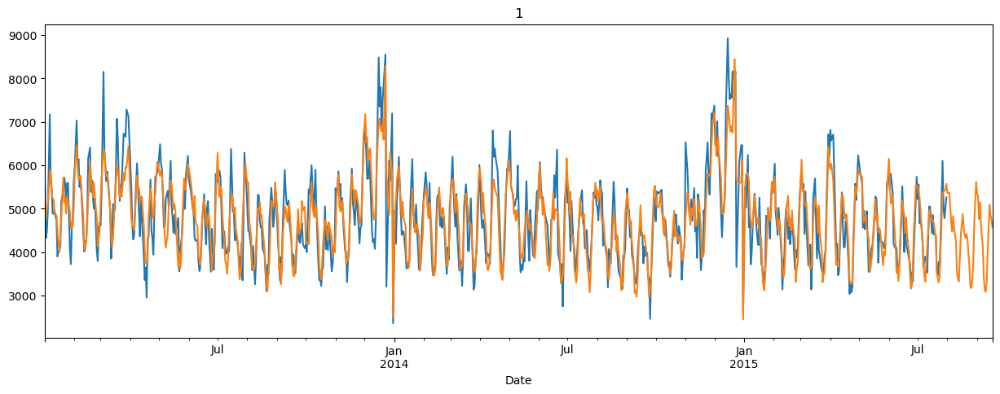

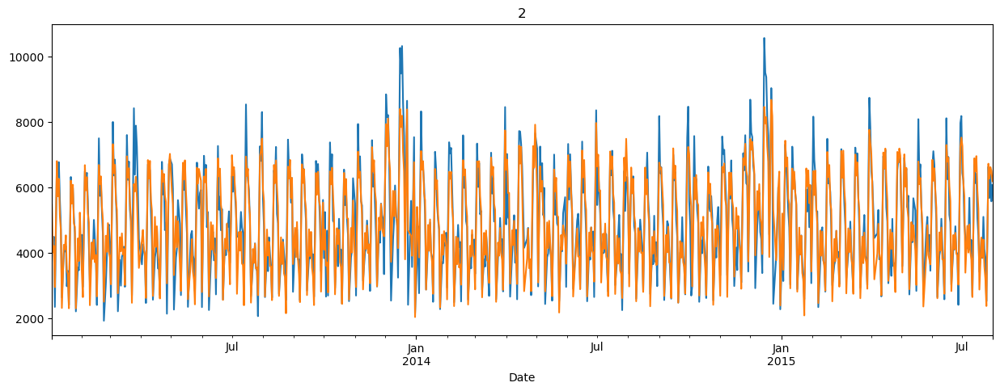

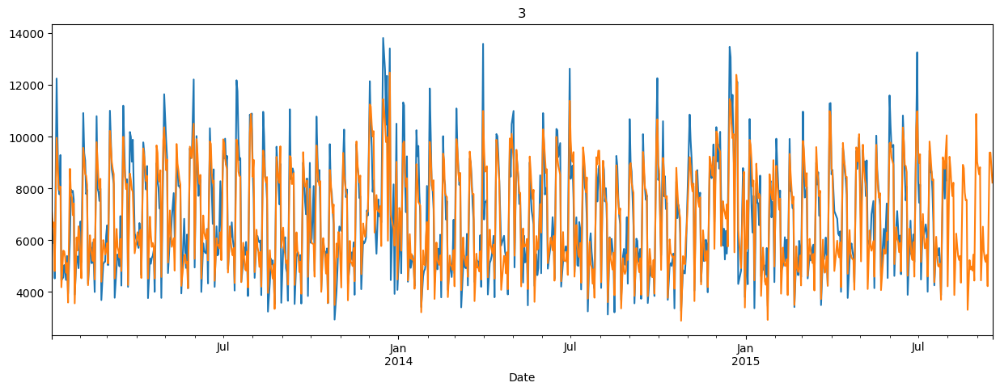

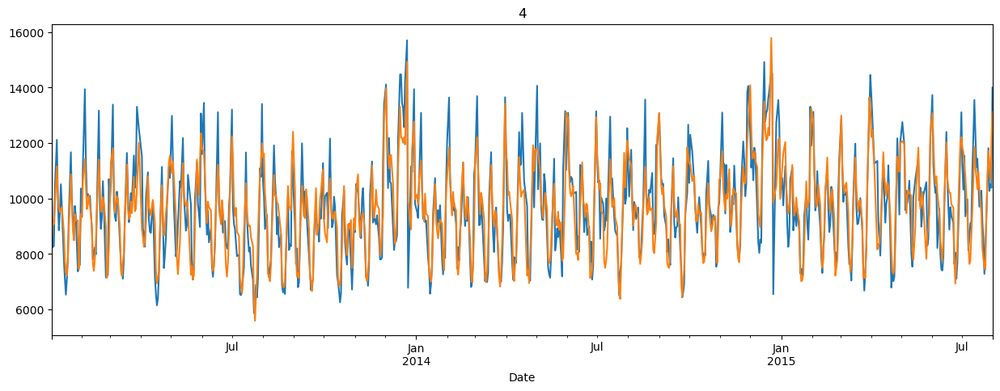

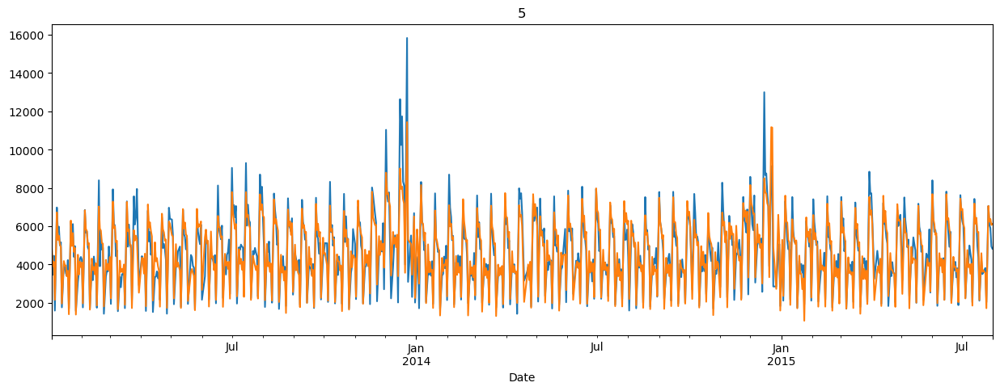

...

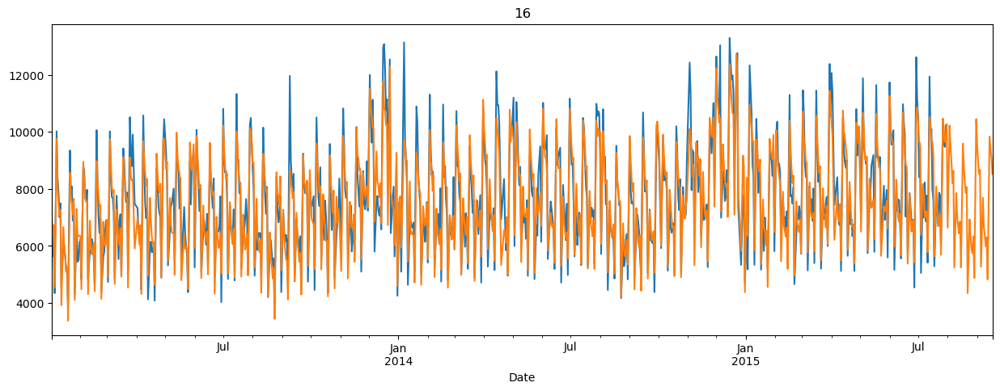

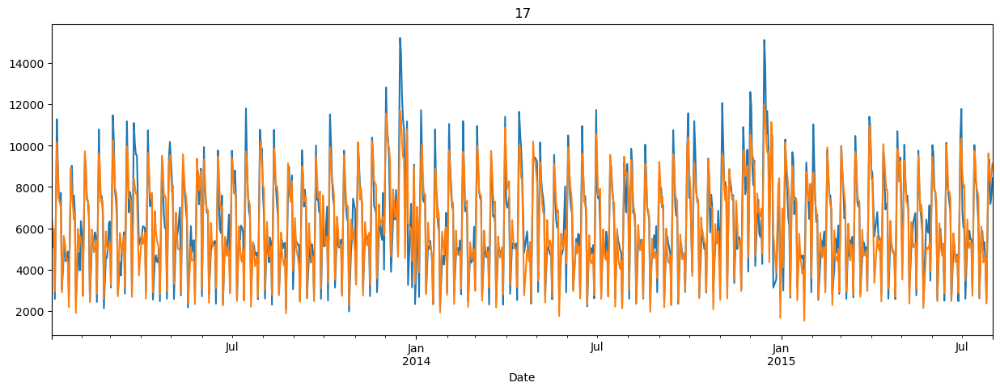

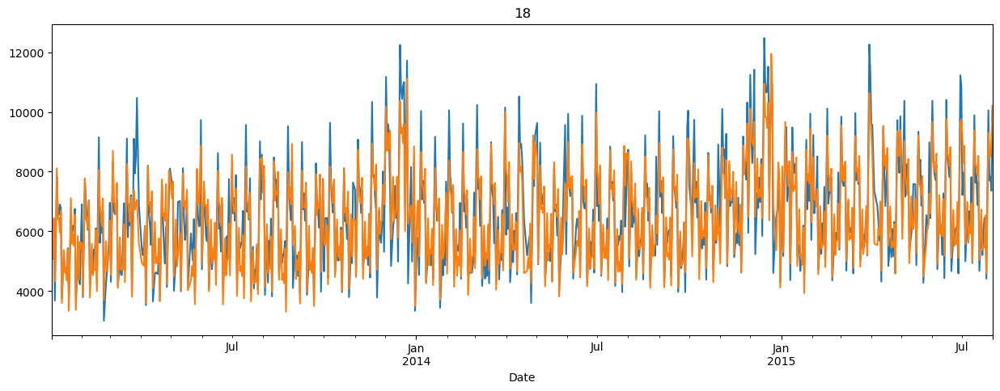

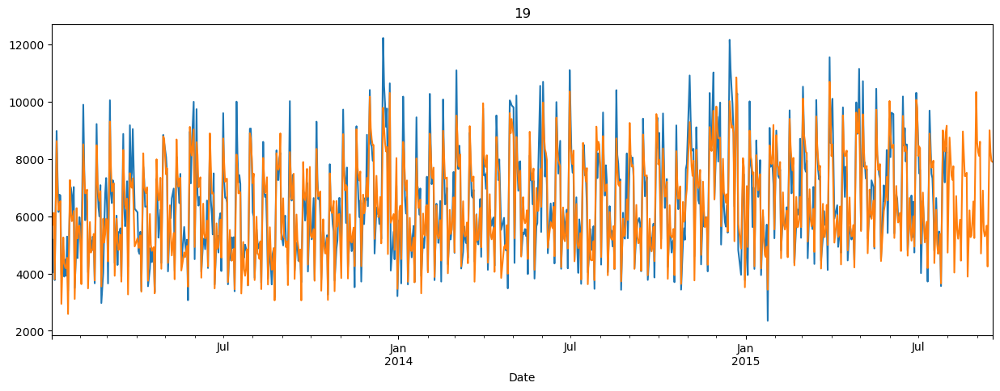

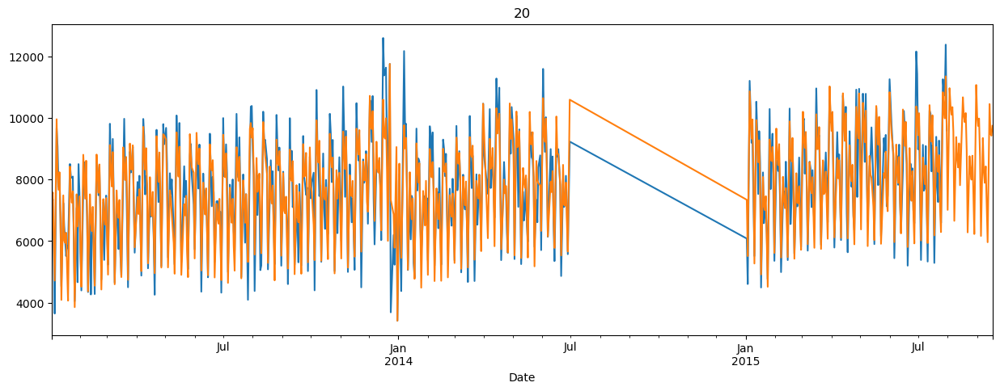

In [218]:
for i in stores_N[:20]:
    plt.figure(figsize(15,5))
    (df4_with_predicts[df4_with_predicts['Open'] == 1].loc[(i,)]['Sales']).plot(title=i)
    (df4_with_predicts[df4_with_predicts['Open'] == 1].loc[(i,)]['Sales_LR_Predict']).plot(title=i)

In [219]:
df4_with_predicts.loc[(938,)]

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Set,Id,SalesLog,DateDay,DateWeek,DateMonth,DateYear,DateDayOfYear,DateInt,StoreType,Assortment,CompetitionDistance,CompetitionOpenInt,PromoInterval0,Delete,Outlier,Sales_LR_Predict,lag_28,lag_14,lag_7,lag_2,lag_1
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,2,7822.0,0.0,0.0,0,2,1,1,NaN,0.000000,1,1,1,2013,1,1356998400000000000,0,0,2820.0,1251763200000000000,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,3,8551.0,968.0,1.0,0,1,1,1,NaN,9.053920,2,1,1,2013,2,1357084800000000000,0,0,2820.0,1251763200000000000,-1.0,NaN,False,9243.258482,NaN,NaN,NaN,NaN,NaN
2013-01-03,4,8233.0,898.0,1.0,0,1,1,1,NaN,9.016027,3,1,1,2013,3,1357171200000000000,0,0,2820.0,1251763200000000000,-1.0,NaN,False,8411.501307,NaN,NaN,NaN,NaN,NaN
2013-01-04,5,7411.0,863.0,1.0,0,1,1,1,NaN,8.910856,4,1,1,2013,4,1357257600000000000,0,0,2820.0,1251763200000000000,-1.0,NaN,False,8714.967146,NaN,NaN,NaN,NaN,NaN
2013-01-05,6,7606.0,837.0,1.0,0,1,0,1,NaN,8.936824,5,1,1,2013,5,1357344000000000000,0,0,2820.0,1251763200000000000,-1.0,NaN,False,8503.318231,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-13,7,NaN,NaN,0.0,0,1,0,0,4151.0,NaN,13,37,9,2015,256,1442102400000000000,0,0,2820.0,1251763200000000000,-1.0,NaN,NaN,8244.724903,NaN,NaN,NaN,NaN,NaN
2015-09-14,1,NaN,NaN,1.0,1,1,0,0,3295.0,NaN,14,38,9,2015,257,1442188800000000000,0,0,2820.0,1251763200000000000,-1.0,NaN,NaN,11623.873864,NaN,NaN,NaN,NaN,NaN
2015-09-15,2,NaN,NaN,1.0,1,1,0,0,2439.0,NaN,15,38,9,2015,258,1442275200000000000,0,0,2820.0,1251763200000000000,-1.0,NaN,NaN,10851.665500,NaN,NaN,NaN,NaN,NaN


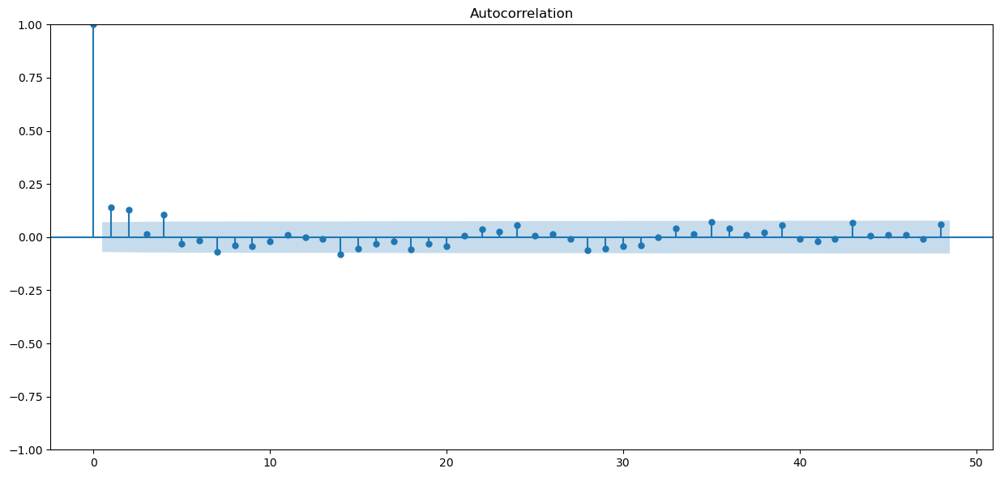

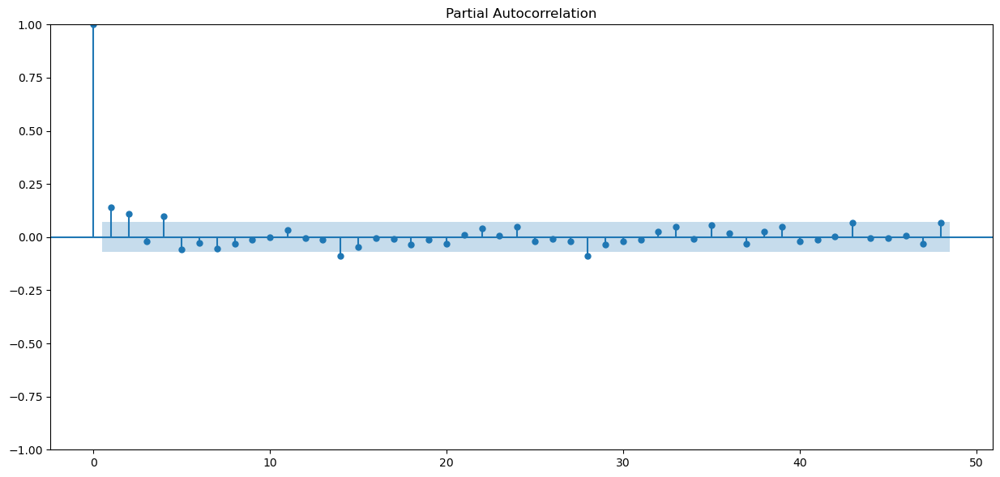

In [221]:
# автокорреляция и частичная автокорреляция остатков

plt.figure(figsize(15,15))

s = df4_with_predicts.loc[(df4_with_predicts['Set'] == 1) & (df4_with_predicts['Open'] == 1)].loc[(1,)]['Sales']
r = df4_with_predicts.loc[(df4_with_predicts['Set'] == 1) & (df4_with_predicts['Open'] == 1)].loc[(1,)]['Sales_LR_Predict']

ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(s - r, lags=48, ax=ax)
pylab.show()

ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(s - r, lags=48, ax=ax)
pylab.show()

<AxesSubplot:title={'center':'Periodogram'}, ylabel='Variance'>

<Figure size 1500x500 with 0 Axes>

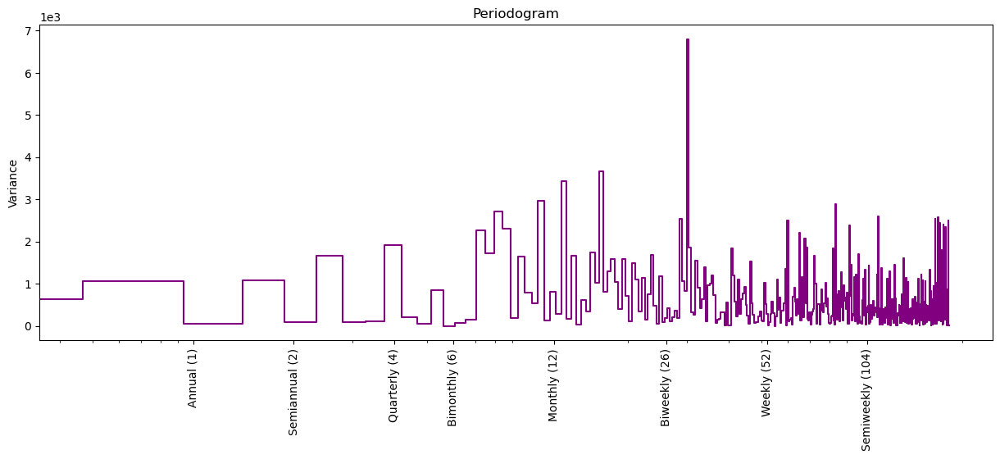

In [222]:
plt.figure(figsize(15,5))
plot_periodogram(s-r)

In [44]:
df4_with_predicts_final = df4_with_predicts.reset_index()

df4_with_predicts_final.loc[df4_with_predicts_final['Open'] == 0, 'Sales_LR_Predict'] = 0

## Export data

In [45]:
X_submit = df4_with_predicts_final.loc[df4_with_predicts_final['Set'] == 0]

ypred = df4_with_predicts_final.loc[df4_with_predicts_final['Set'] == 0, 'Sales_LR_Predict']


df_ypred = X_submit['Id'].reset_index()
del df_ypred['index']
df_ypred['Id'] = df_ypred['Id'].astype('int')


df_ypred['Sales'] = ypred.to_numpy() * 0.97  #   * 0.97  улучшает сильно

df_ypred.sort_values('Id', inplace=True)
df_ypred[['Id', 'Sales']].to_csv('rossmann_best_no_ext_data_scaled.csv', index=False)